<a href="https://colab.research.google.com/github/dbtjr1103/Basic_practice/blob/main/Food_%26_Landscape_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os.path
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

from pathlib import Path
from tqdm import tqdm
from time import perf_counter

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score
from IPython.display import Markdown, display

# dataset 불러오기

In [ ]:
!pip install -U --no-cache-dir gdown --pre

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [ ]:
!gdown 1--zzEz-AUajDmmXsVeBMVOks3aJ6yeXJ

Downloading...
From: https://drive.google.com/uc?id=1--zzEz-AUajDmmXsVeBMVOks3aJ6yeXJ
To: /content/food12_dataset.zip
100% 285M/285M [00:06<00:00, 42.2MB/s]


In [ ]:
!unzip -q food12_dataset.zip
# dataset내 dataset.zip파일 삭제...

In [ ]:
rmdir /content/dataset/.ipynb_checkpoints

rmdir: failed to remove '/content/dataset/.ipynb_checkpoints': No such file or directory


In [ ]:
import shutil
shutil.rmtree('/content/dataset/train/hot_dog')
shutil.rmtree('/content/dataset/train/sashimi')

# 케글


In [ ]:
!pip install split-folders
!pip install -q kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# .kaggle 폴더 생성
!mkdir -p ~/.kaggle/
# kaggle.josn .kaggle로 복사
!cp kaggle.json ~/.kaggle/
# 해당 폴더 목록 확인(복사 잘 되었는지 확인)
!ls ~/.kaggle

kaggle.json


In [ ]:
cd ~

/root


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
cd /content

/content


In [ ]:
!kaggle datasets download -d kmader/food41

100% 5.28G/5.30G [00:35<00:00, 215MB/s]
100% 5.30G/5.30G [00:35<00:00, 160MB/s]


In [ ]:
!unzip -q food41.zip

In [ ]:
!kaggle datasets download -d huseynguliyev/landscape-classification

 96% 116M/121M [00:00<00:00, 208MB/s] 
100% 121M/121M [00:00<00:00, 181MB/s]


In [ ]:
!unzip -q landscape-classification.zip

In [ ]:
folder_path = '/content/intel-image-classification/train'
label_names = os.listdir(folder_path)
len(label_names)

6

In [ ]:
cd /content/images/

/content/images


In [ ]:
# 라벨이름 폴더 생성 
for label in label_names:
    os.mkdir(label)

In [ ]:
dataset = {}

# 이미지와 라벨 리스트에 담기
for label in label_names:
    sub_path = folder_path+'/'+label+'/'
    dataset[label] = []
    for filename in os.listdir(sub_path):
        dataset[label].append(sub_path+filename)

len(dataset)

6

In [ ]:
# 폴더 옮기기
for label, filenames in tqdm(dataset.items()):
    for filename in filenames:
        img = cv2.imread(filename)       
        # cv2.imwrite('/content/dataset/train/{0}/{1}'.format(label, filename.split("/")[-1]) , img)
        cv2.imwrite('/content/images/{0}/{1}'.format(label, filename.split("/")[-1]) , img)

100%|██████████| 6/6 [00:06<00:00,  1.15s/it]


# Data handling

In [ ]:
# 이미지 경로를 데이터 프레임 형태로 만드는 함수
dir_ = Path('/content/images/')
dir_ = Path('/content/images/')

filepaths = list(dir_.glob(r'**/*.jpg'))
def proc_img(filepath):
    """
   		이미지데이터의 경로와 label데이터로 데이터프레임 만들기 
    """

    labels = [str(filepath[i]).split("/")[-2] \
              for i in range(len(filepath))]

    filepath = pd.Series(filepath, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # 경로와 라벨 concatenate
    df = pd.concat([filepath, labels], axis=1)

    # index 재설정
    df = df.sample(frac=1,random_state=0).reset_index(drop = True)
    
    return df
df = proc_img(filepaths)
df

,Filepath,Label
0,/content/images/french_onion_soup/502647.jpg,french_onion_soup
1,/content/images/miso_soup/1365299.jpg,miso_soup
2,/content/images/panna_cotta/1856024.jpg,panna_cotta
3,/content/images/bruschetta/643181.jpg,bruschetta
4,/content/images/pad_thai/1103192.jpg,pad_thai
...,...,...
106995,/content/images/hamburger/272642.jpg,hamburger
106996,/content/images/eggs_benedict/2563868.jpg,eggs_benedict
106997,/content/images/risotto/75664.jpg,risotto
106998,/content/images/steak/1012080.jpg,steak


In [ ]:
print(f'Number of pictures: {df.shape[0]}\n')
print(f'Number of different labels: {len(df.Label.unique())}\n')
print(f'Labels: {df.Label.unique()}')

Number of pictures: 107000

Number of different labels: 107

Labels: ['french_onion_soup' 'miso_soup' 'panna_cotta' 'bruschetta' 'pad_thai'
 'cannoli' 'nachos' 'grilled_cheese_sandwich' 'forest' 'pizza'
 'spring_rolls' 'scallops' 'cheese_plate' 'onion_rings' 'clam_chowder'
 'baby_back_ribs' 'donuts' 'omelette' 'risotto' 'chicken_wings' 'edamame'
 'mussels' 'cheesecake' 'garlic_bread' 'cup_cakes' 'oysters'
 'red_velvet_cake' 'fried_rice' 'eggs_benedict' 'ravioli' 'pancakes'
 'grilled_salmon' 'street' 'frozen_yogurt' 'greek_salad' 'crab_cakes'
 'macaroni_and_cheese' 'creme_brulee' 'apple_pie' 'lasagna' 'guacamole'
 'spaghetti_carbonara' 'fried_calamari' 'paella' 'strawberry_shortcake'
 'beef_tartare' 'glacier' 'club_sandwich' 'churros' 'croque_madame'
 'tiramisu' 'caprese_salad' 'chocolate_mousse' 'pho' 'french_fries'
 'ceviche' 'pork_chop' 'falafel' 'hot_and_sour_soup' 'caesar_salad'
 'ramen' 'huevos_rancheros' 'bibimbap' 'mountain' 'hamburger' 'samosa'
 'takoyaki' 'ice_cream' 'steak' '

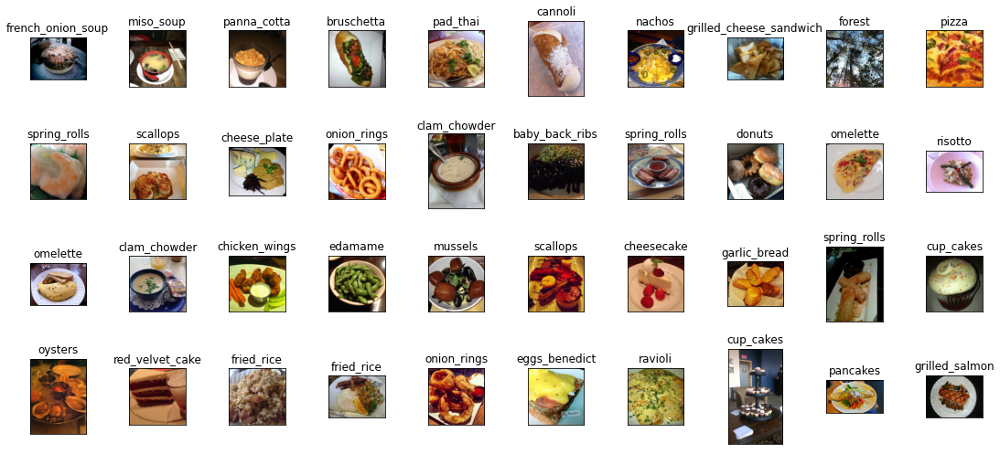

In [ ]:
# 이미지 데이터 확인
fig, axes = plt.subplots(nrows=4, ncols=10, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df.Filepath[i]))
    ax.set_title(df.Label[i], fontsize = 12)
plt.tight_layout(pad=0.5)
plt.show()

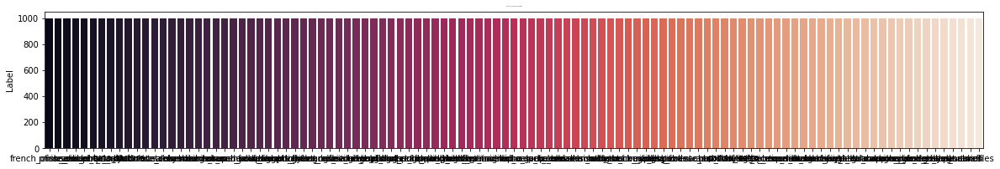

In [ ]:
# Label Category 분포 확인
vc = df['Label'].value_counts()
plt.figure(figsize=(20,3))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 0.1)
plt.show()

In [ ]:
# Training/test split
train_df,test_df = train_test_split(df, test_size=0.1,random_state=0)
train_df.shape,test_df.shape

((96300, 2), (10700, 2))

In [ ]:
# 모델 전처리
import numpy as np
import tensorflow as tf


from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   validation_split=0.2)

train_gen = train_datagen.flow_from_directory('/content/images',
                                                 target_size = (224, 224),
                                                 batch_size = 128,
                                                 class_mode = 'categorical',subset='training')
val_gen  = train_datagen.flow_from_directory('/content/images',
                                                 target_size = (224, 224),
                                                 batch_size = 128,
                                                 class_mode = 'categorical',subset='validation')

Found 85600 images belonging to 107 classes.
Found 21400 images belonging to 107 classes.


In [ ]:
# 데이터 증강(Data Augmentation)으로 이미지 로드
def create_gen():
    # 생성기 및 데이터 증강으로 이미지 로드
    train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.1
    )

    test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
    )

    train_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath', # 파일위치 열이름
        y_col='Label', # 클래스 열이름
        target_size=(224, 224), # 이미지 사이즈
        color_mode='rgb', # 이미지 채널수
        class_mode='categorical', # Y값(Label값)
        batch_size=32,
        shuffle=True, # 데이터를 섞을지 여부
        seed=0,
        subset='training', # train 인지 val인지 설정
        rotation_range=30, # 회전제한 각도 30도
        zoom_range=0.15, # 확대 축소 15%
        width_shift_range=0.2, # 좌우이동 20%
        height_shift_range=0.2, # 상하이동 20%
        shear_range=0.15, # 반시계방햐의 각도
        horizontal_flip=True, # 좌우 반전 True
        fill_mode="nearest"
        # 이미지 변경시 보완 방법 (constant, nearest, reflect, wrap) 4개 존재
    )

    val_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='validation',
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    test_images = test_generator.flow_from_dataframe(
        dataframe=test_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=False
    )
    
    return train_generator,test_generator,train_images,val_images,test_images
# 회전각도, 확대축소, 좌우이동, 상하이동, 좌우반전 등 데이터 증강의 많은 기법을 사용해서 
# Train과 Val 데이터에 적용했고 Test 데이터는 학습에 사용되지 않기 때문에 증강기법을 적용하지 않았다.

In [ ]:
# 전이학습을 사용해서 모델 성능 높이기
models = {
    "MobileNetV2": {"model":tf.keras.applications.MobileNetV2, "perf":0},
    "DenseNet201": {"model":tf.keras.applications.DenseNet201, "perf":0}
}
# Create the generators
train_generator,test_generator,train_images,val_images,test_images=create_gen()
print('\n')

def get_model(model):
# Load the pretained model
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights':'imagenet',
                'pooling':'avg'
                }
    
    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False # 레이어를 동결 시켜서 훈련중 손실을 최소화 한다.
    
    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(16, activation='softmax')(x)


    # 라벨 개수가 8개이기 때문에 Dencs도 8로 설정
    model = tf.keras.Model(inputs=inputs, outputs=outputs)


    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )


    return model

# Train모델 학습
for name, model in models.items():
        
    # 전이 학습 모델 가져오기
    m = get_model(model['model'])
    models[name]['model'] = m
    
    start = perf_counter()
        
    # 모델 학습
    
    history = m.fit(train_images,validation_data=val_images,epochs=1,verbose=0)
        
    # 학습시간과 val_accuracy 저장
    duration = perf_counter() - start
    duration = round(duration,2)
    models[name]['perf'] = duration
    print(f"{name:20} trained in {duration} sec")
    
    val_acc = history.history['val_accuracy']
    models[name]['val_acc'] = [round(v,4) for v in val_acc]

In [ ]:
# test데이터로 모델 성능 예측
for name, model in models.items():
    
    # Predict the label of the test_images
    pred = models[name]['model'].predict(test_images)
    pred = np.argmax(pred,axis=1)

    # Map the label
    labels = (train_images.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]

    y_test = list(test_df.Label)
    acc = accuracy_score(y_test,pred)
    models[name]['acc'] = round(acc,4)
    print(f'**{name} has a {acc * 100:.2f}% accuracy on the test set**')
   
# Create a DataFrame with the results
models_result = []

for name, v in models.items():
    models_result.append([ name, models[name]['val_acc'][-1], 
                          models[name]['acc'],
                          models[name]['perf']])
    
df_results = pd.DataFrame(models_result, 
                          columns = ['model','val_accuracy','accuracy','Training time (sec)'])
df_results.sort_values(by='accuracy', ascending=False, inplace=True)
df_results.reset_index(inplace=True,drop=True)
df_results

# 모델 선택 후 재학습

## dense 201

In [ ]:
train_df,test_df = train_test_split(df, test_size=0.1, random_state=0)
train_generator,test_generator,train_images,val_images,test_images=create_gen()

model = get_model(tf.keras.applications.DenseNet201)
history = model.fit(train_images,validation_data=val_images,epochs=7)

Found 10530 validated image filenames belonging to 16 classes.
Found 1170 validated image filenames belonging to 16 classes.
Found 1300 validated image filenames belonging to 16 classes.
Epoch 1/7
330/330 [==============================] - 68s 175ms/step - loss: 0.5891 - accuracy: 0.8107 - val_loss: 0.3913 - val_accuracy: 0.8709
Epoch 2/7
330/330 [==============================] - 54s 165ms/step - loss: 0.3085 - accuracy: 0.8969 - val_loss: 0.3853 - val_accuracy: 0.8744
Epoch 3/7
330/330 [==============================] - 54s 164ms/step - loss: 0.2522 - accuracy: 0.9149 - val_loss: 0.3883 - val_accuracy: 0.8812
Epoch 4/7
330/330 [==============================] - 54s 165ms/step - loss: 0.1947 - accuracy: 0.9322 - val_loss: 0.3511 - val_accuracy: 0.8769
Epoch 5/7
330/330 [==============================] - 54s 164ms/step - loss: 0.1490 - accuracy: 0.9471 - val_loss: 0.3629 - val_accuracy: 0.8829
Epoch 6/7
330/330 [==============================] - 54s 165ms/step - loss: 0.1236 - accuracy

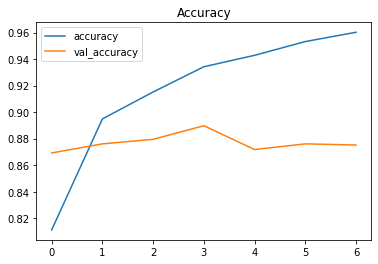

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

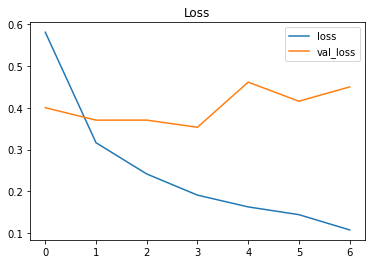

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]
    
y_test = list(test_df.Label)
acc = accuracy_score(y_test,pred)
print(f'Accuracy on the test set: {acc * 100:.2f}%')

41/41 [==============================] - 8s 142ms/step
Accuracy on the test set: 86.62%


## 혼동행렬

In [ ]:
class_report = classification_report(y_test, pred, zero_division=1)
print(class_report)

               precision    recall  f1-score   support

    apple_pie       0.73      0.70      0.71        66
     bibimbap       0.87      0.85      0.86        71
    buildings       0.80      0.94      0.86        77
   cheesecake       0.80      0.75      0.77        75
club_sandwich       0.86      0.73      0.79        49
       forest       0.95      0.95      0.95       110
   fried_rice       0.88      0.83      0.85        63
      glacier       0.76      0.81      0.78       108
    hamburger       0.78      0.86      0.82        78
     mountain       0.84      0.73      0.78       114
        pizza       0.93      0.83      0.88        76
        ramen       0.83      0.89      0.86        73
          sea       0.92      0.94      0.93        93
       street       0.94      0.88      0.91        99
        sushi       0.81      0.87      0.84        76
      waffles       0.78      0.89      0.83        72

     accuracy                           0.84      1300
    macr

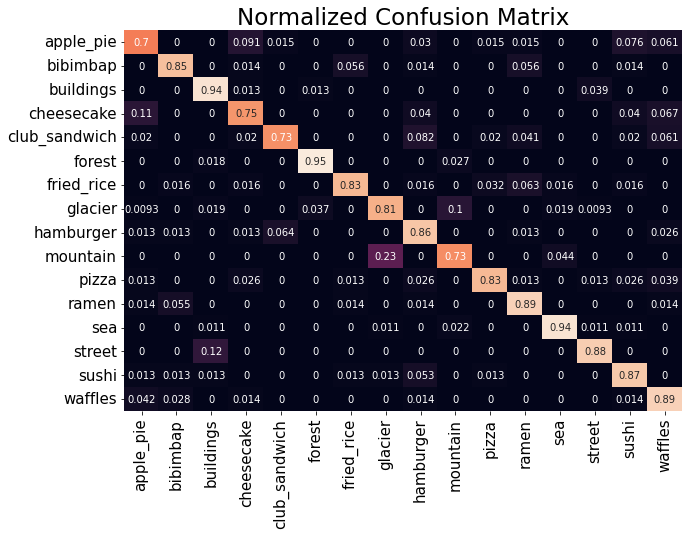

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,7))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)),cbar=False)
plt.title('Normalized Confusion Matrix', fontsize = 23)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

## 실전 모델 예측

번호를 입력하세요 : 8
1/1 [==============================] - 0s 35ms/step


## 예측률 : 97.32%

### Class prediction = bibimbap

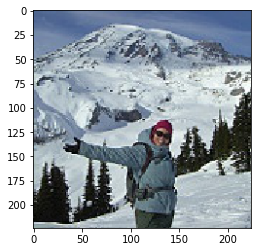

In [ ]:
# from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

label_path = '/content/dataset/train'
label_names = os.listdir(label_path)

class_dictionary = {}
for idx, label in enumerate(label_names):
    class_dictionary[label] = idx

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))

IMAGE_SIZE    = (224, 224)
number_1 = int(input("번호를 입력하세요 : ")) # 10, 50, 100
test_image = image.load_img(test_df.iloc[number_1, 0]
                            ,target_size =IMAGE_SIZE )
test_image = image.img_to_array(test_image)
plt.imshow(test_image/255.);

test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
test_image = preprocess_input(test_image)
prediction = model.predict(test_image)

df = pd.DataFrame({'pred':prediction[0]})
df = df.sort_values(by='pred', ascending=False, na_position='first')
printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

for x in class_dictionary:
  if class_dictionary[x] == (df[df == df.iloc[0]].index[0]):
    printmd(f"### Class prediction = {x}")
    break

뻔한거 78

## 여러이미지

1/1 [==============================] - 0s 35ms/step


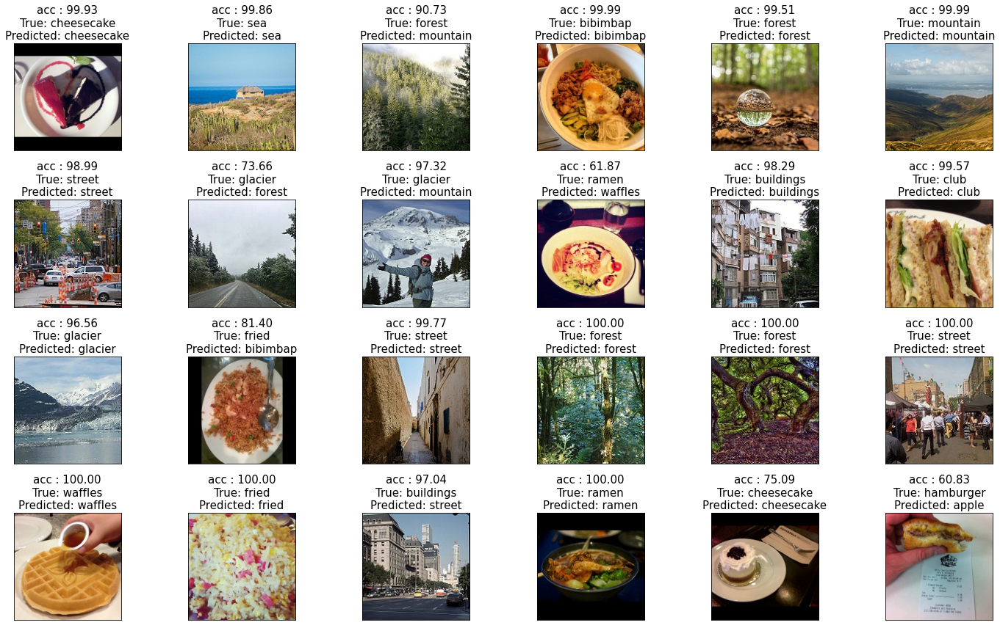

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i].split('_')[0]}\nPredicted: {pred[i].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

## resnet512

In [ ]:
train_df,test_df = train_test_split(df, test_size=0.1, random_state=0)
train_generator,test_generator,train_images,val_images,test_images=create_gen()

model2 = get_model(tf.keras.applications.ResNet152V2)
history = model2.fit(train_images,validation_data=val_images,epochs=7)

Found 10530 validated image filenames belonging to 16 classes.
Found 1170 validated image filenames belonging to 16 classes.
Found 1300 validated image filenames belonging to 16 classes.
Epoch 1/7
330/330 [==============================] - 96s 268ms/step - loss: 0.6311 - accuracy: 0.7992 - val_loss: 0.5748 - val_accuracy: 0.8222
Epoch 2/7
330/330 [==============================] - 86s 261ms/step - loss: 0.3341 - accuracy: 0.8858 - val_loss: 0.4793 - val_accuracy: 0.8436
Epoch 3/7
330/330 [==============================] - 86s 261ms/step - loss: 0.2402 - accuracy: 0.9203 - val_loss: 0.4921 - val_accuracy: 0.8427
Epoch 4/7
330/330 [==============================] - 86s 260ms/step - loss: 0.1737 - accuracy: 0.9396 - val_loss: 0.5658 - val_accuracy: 0.8402
Epoch 5/7
330/330 [==============================] - 86s 261ms/step - loss: 0.1287 - accuracy: 0.9558 - val_loss: 0.5164 - val_accuracy: 0.8573
Epoch 6/7
330/330 [==============================] - 86s 260ms/step - loss: 0.0950 - accuracy

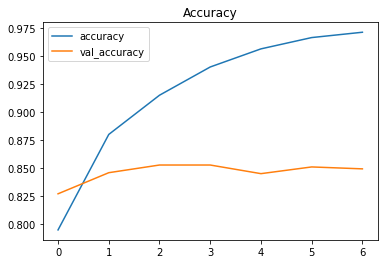

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

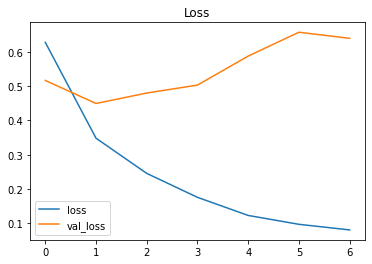

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))
    
y_test = list(test_df.Label)
acc = accuracy_score(y_test,pred)
printmd(f'# Accuracy on the test set: {acc * 100:.2f}%')

41/41 [==============================] - 12s 253ms/step


# Accuracy on the test set: 84.31%

In [ ]:
class_report = classification_report(y_test, pred, zero_division=1)
print(class_report)

               precision    recall  f1-score   support

    apple_pie       0.73      0.70      0.71        66
     bibimbap       0.87      0.85      0.86        71
    buildings       0.80      0.94      0.86        77
   cheesecake       0.80      0.75      0.77        75
club_sandwich       0.86      0.73      0.79        49
       forest       0.95      0.95      0.95       110
   fried_rice       0.88      0.83      0.85        63
      glacier       0.76      0.81      0.78       108
    hamburger       0.78      0.86      0.82        78
     mountain       0.84      0.73      0.78       114
        pizza       0.93      0.83      0.88        76
        ramen       0.83      0.89      0.86        73
          sea       0.92      0.94      0.93        93
       street       0.94      0.88      0.91        99
        sushi       0.81      0.87      0.84        76
      waffles       0.78      0.89      0.83        72

     accuracy                           0.84      1300
    macr

## 혼동행렬

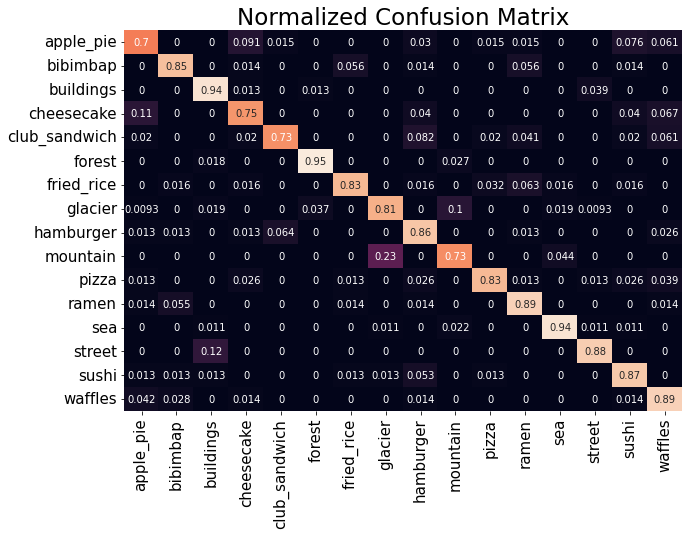

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,7))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)),cbar=False)
plt.title('Normalized Confusion Matrix', fontsize = 23)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

## 실전 모델 예측

번호를 입력하세요 : 1
1/1 [==============================] - 0s 38ms/step


## 예측률 : 99.86%

### Class prediction = fried_rice

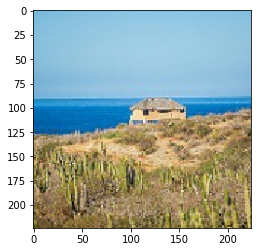

In [ ]:
# from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

label_path = '/content/dataset/train'
label_names = os.listdir(label_path)

class_dictionary = {}
for idx, label in enumerate(label_names):
    class_dictionary[label] = idx

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))

IMAGE_SIZE    = (224, 224)
number_1 = int(input("번호를 입력하세요 : ")) # 10, 50, 100
test_image = image.load_img(test_df.iloc[number_1, 0]
                            ,target_size =IMAGE_SIZE )
test_image = image.img_to_array(test_image)
plt.imshow(test_image/255.);

test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
test_image = preprocess_input(test_image)
prediction = model.predict(test_image)

df = pd.DataFrame({'pred':prediction[0]})
df = df.sort_values(by='pred', ascending=False, na_position='first')
printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

for x in class_dictionary:
  if class_dictionary[x] == (df[df == df.iloc[0]].index[0]):
    printmd(f"### Class prediction = {x}")
    break

1/1 [==============================] - 0s 34ms/step


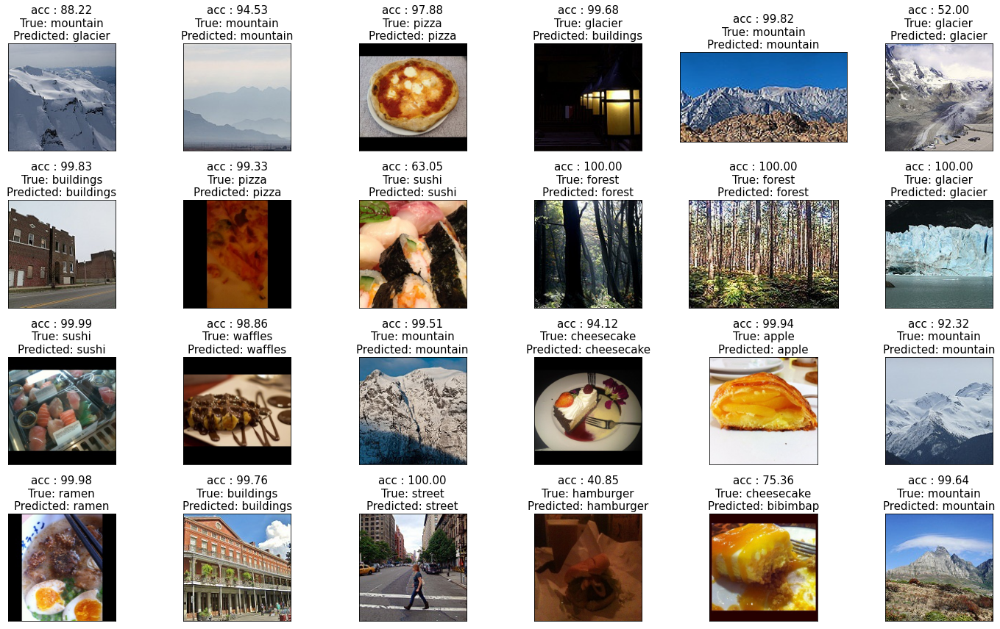

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i+24, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+24]))
    ax.set_title(f"acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+24].split('_')[0]}\nPredicted: {pred[i+24].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

# lable food 101 + land 6 = dense 201

In [ ]:
def get_model(model):
# Load the pretained model
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights':'imagenet',
                'pooling':'avg'
                }
    
    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False # 레이어를 동결 시켜서 훈련중 손실을 최소화 한다.
    
    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(1024, activation='relu')(pretrained_model.output)
    # x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    # x = tf.keras.layers.Dropout(0.5)(x)

    outputs = tf.keras.layers.Dense(107, activation='softmax')(x)

    # 라벨 개수가 8개이기 때문에 Dencs도 8로 설정
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
train_df,test_df = train_test_split(df, test_size=0.1, random_state=0)
train_generator,test_generator,train_images,val_images,test_images=create_gen()

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=1, min_lr=0)

early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

model = get_model(tf.keras.applications.DenseNet201)
history = model.fit(train_images,validation_data=val_images,epochs=15, callbacks=[early, reduce_lr])

Found 86670 validated image filenames belonging to 107 classes.
Found 9630 validated image filenames belonging to 107 classes.
Found 10700 validated image filenames belonging to 107 classes.
74836368/74836368 [==============================] - 0s 0us/step
Epoch 1/15
2709/2709 [==============================] - 660s 236ms/step - loss: 1.9363 - accuracy: 0.5103 - val_loss: 1.6022 - val_accuracy: 0.5798 - lr: 0.0010
Epoch 2/15
2709/2709 [==============================] - 594s 219ms/step - loss: 1.3945 - accuracy: 0.6314 - val_loss: 1.4527 - val_accuracy: 0.6171 - lr: 0.0010
Epoch 3/15
2709/2709 [==============================] - 561s 207ms/step - loss: 1.2288 - accuracy: 0.6721 - val_loss: 1.4119 - val_accuracy: 0.6329 - lr: 0.0010
Epoch 4/15
2709/2709 [==============================] - 557s 206ms/step - loss: 1.1016 - accuracy: 0.7012 - val_loss: 1.4245 - val_accuracy: 0.6376 - lr: 0.0010
Epoch 5/15
2709/2709 [==============================] - 547s 202ms/step - loss: 0.7579 - accuracy: 0

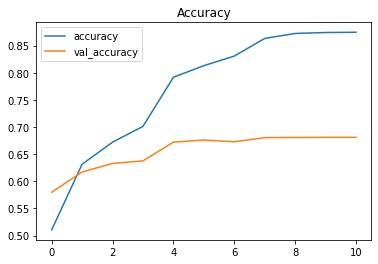

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

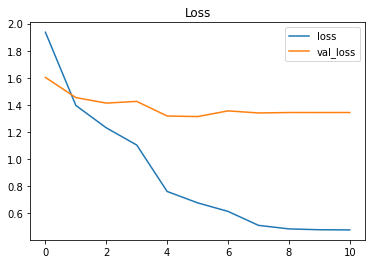

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]
    
y_test = list(test_df.Label)
acc = accuracy_score(y_test,pred)
print(f'Accuracy on the test set: {acc * 100:.2f}%')

335/335 [==============================] - 77s 220ms/step
Accuracy on the test set: 67.97%


## 혼동행렬

In [ ]:
class_report = classification_report(y_test, pred, zero_division=1)
print(class_report)

                         precision    recall  f1-score   support

              apple_pie       0.45      0.38      0.42        99
         baby_back_ribs       0.60      0.68      0.64        81
                baklava       0.69      0.74      0.71       107
         beef_carpaccio       0.73      0.70      0.72       105
           beef_tartare       0.50      0.44      0.47       119
             beet_salad       0.58      0.58      0.58        93
               beignets       0.83      0.79      0.81       115
               bibimbap       0.81      0.82      0.81        94
          bread_pudding       0.48      0.41      0.44        98
      breakfast_burrito       0.56      0.59      0.58        93
             bruschetta       0.47      0.51      0.49        91
              buildings       0.98      0.90      0.94        92
           caesar_salad       0.76      0.80      0.78       101
                cannoli       0.70      0.71      0.70       102
          caprese_salad 

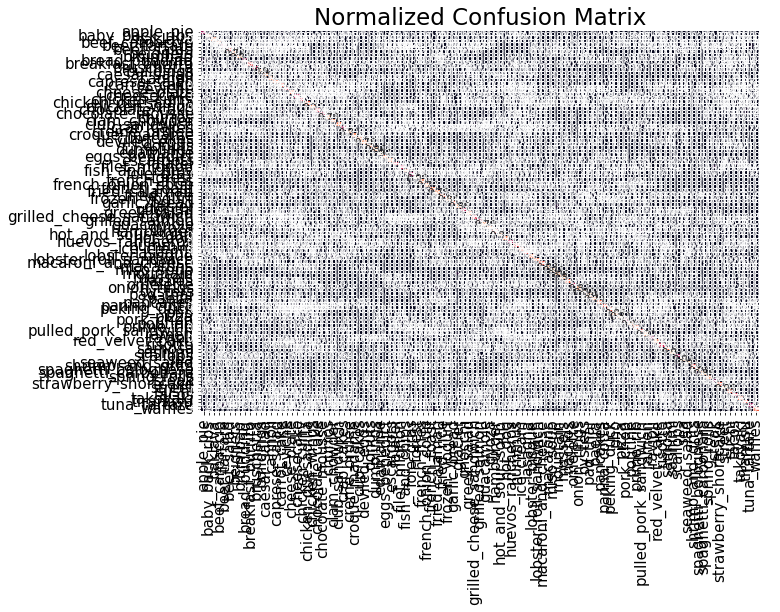

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,7))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)),cbar=False)
plt.title('Normalized Confusion Matrix', fontsize = 23)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

## 실전 예측

1/1 [==============================] - 3s 3s/step


## 예측률 : 99.53%

### Class prediction = buildings

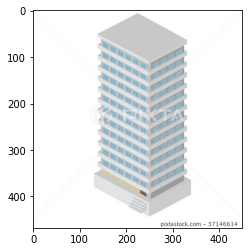

In [ ]:
# from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

label_path = '/content/images'
label_names = sorted(os.listdir(label_path))

class_dictionary = {}
for idx, label in enumerate(label_names):
    class_dictionary[label] = idx

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))

IMAGE_SIZE    = (224, 224)
# number_1 = int(input("번호를 입력하세요 : ")) # 10, 50, 100
test_image = image.load_img('/content/buildings.jpg')
test_image = image.img_to_array(test_image)
plt.imshow(test_image/255.);

test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
test_image = preprocess_input(test_image)
prediction = model.predict(test_image)

df = pd.DataFrame({'pred':prediction[0]})
df = df.sort_values(by='pred', ascending=False, na_position='first')
printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

for x in class_dictionary:
  if class_dictionary[x] == (df[df == df.iloc[0]].index[0]):
    printmd(f"### Class prediction = {x}")
    break

1/1 [==============================] - 0s 42ms/step


## 예측률 : 16.42%

### Class prediction = donuts

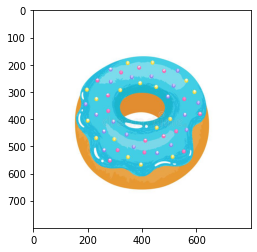

In [ ]:
# from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

label_path = '/content/images'
label_names = sorted(os.listdir(label_path))

class_dictionary = {}
for idx, label in enumerate(label_names):
    class_dictionary[label] = idx

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))

IMAGE_SIZE    = (224, 224)
# number_1 = int(input("번호를 입력하세요 : ")) # 10, 50, 100
test_image = image.load_img('/content/dou.jpg')
test_image = image.img_to_array(test_image)
plt.imshow(test_image/255.);

test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
test_image = preprocess_input(test_image)
prediction = model.predict(test_image)

df = pd.DataFrame({'pred':prediction[0]})
df = df.sort_values(by='pred', ascending=False, na_position='first')
printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

for x in class_dictionary:
  if class_dictionary[x] == (df[df == df.iloc[0]].index[0]):
    printmd(f"### Class prediction = {x}")
    break

1/1 [==============================] - 0s 87ms/step


## 예측률 : 40.63%

### Class prediction = donuts

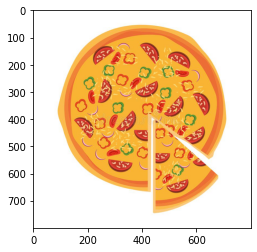

In [ ]:
# from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input

label_path = '/content/images'
label_names = sorted(os.listdir(label_path))

class_dictionary = {}
for idx, label in enumerate(label_names):
    class_dictionary[label] = idx

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))

IMAGE_SIZE    = (224, 224)
# number_1 = int(input("번호를 입력하세요 : ")) # 10, 50, 100
test_image = image.load_img('/content/pizza.jpg')
test_image = image.img_to_array(test_image)
plt.imshow(test_image/255.);

test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
test_image = preprocess_input(test_image)
prediction = model.predict(test_image)

df = pd.DataFrame({'pred':prediction[0]})
df = df.sort_values(by='pred', ascending=False, na_position='first')
printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

for x in class_dictionary:
  if class_dictionary[x] == (df[df == df.iloc[0]].index[0]):
    printmd(f"### Class prediction = {x}")
    break

## 여러이미지

1/1 [==============================] - 0s 78ms/step


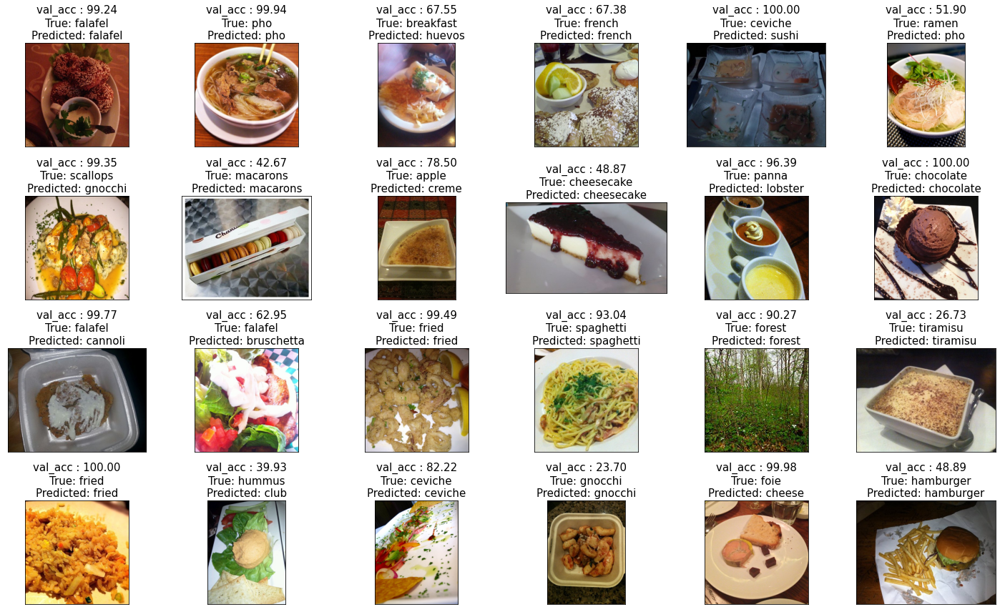

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+24]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+24].split('_')[0]}\nPredicted: {pred[i+24].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 35ms/step


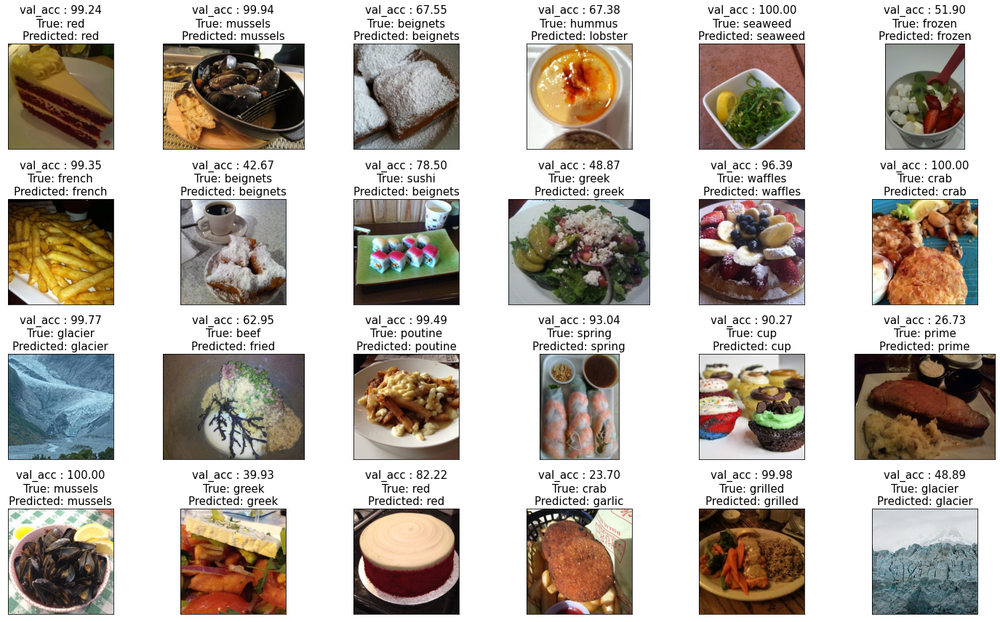

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+50]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+50].split('_')[0]}\nPredicted: {pred[i+50].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 37ms/step


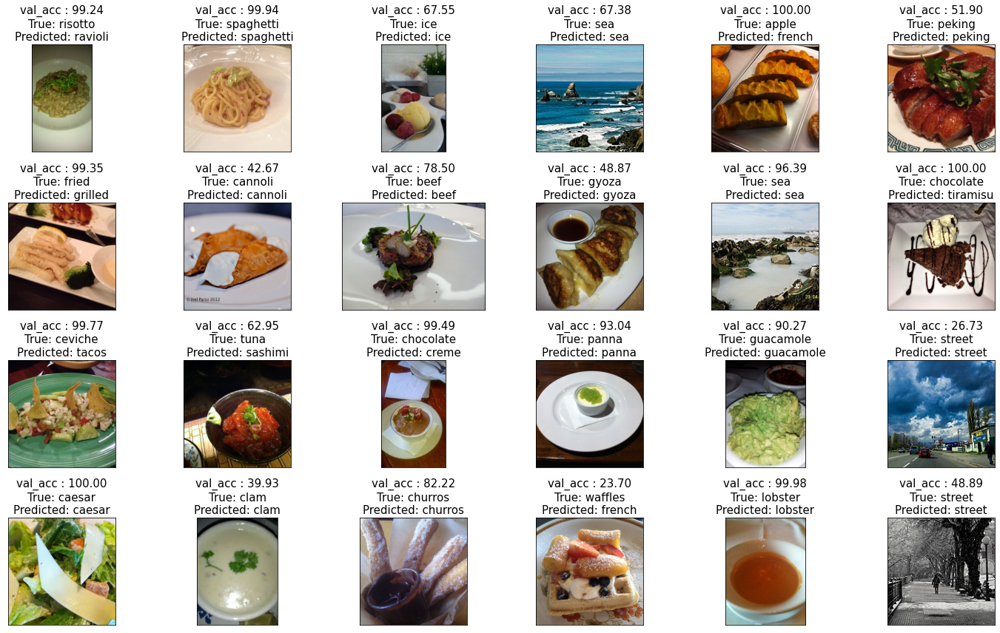

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+80]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+80].split('_')[0]}\nPredicted: {pred[i+80].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 36ms/step


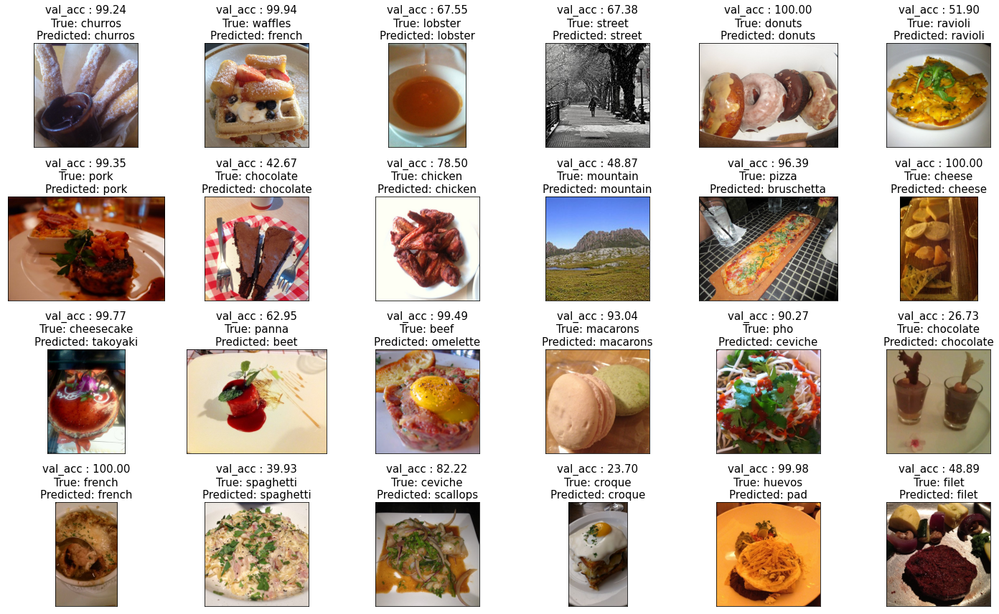

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+100]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+100].split('_')[0]}\nPredicted: {pred[i+100].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 42ms/step


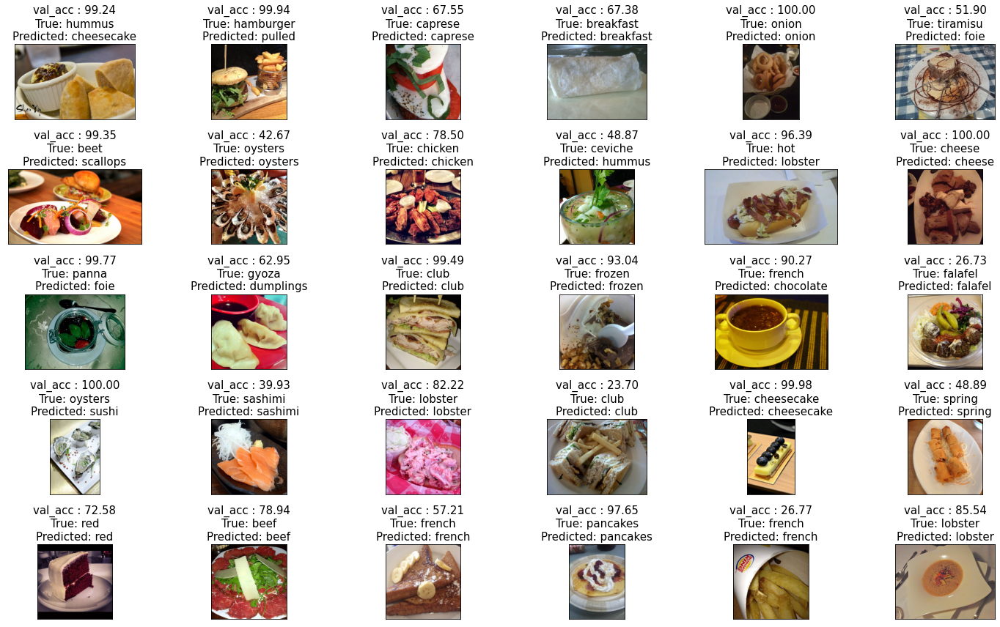

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+300]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+300].split('_')[0]}\nPredicted: {pred[i+300].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 142ms/step


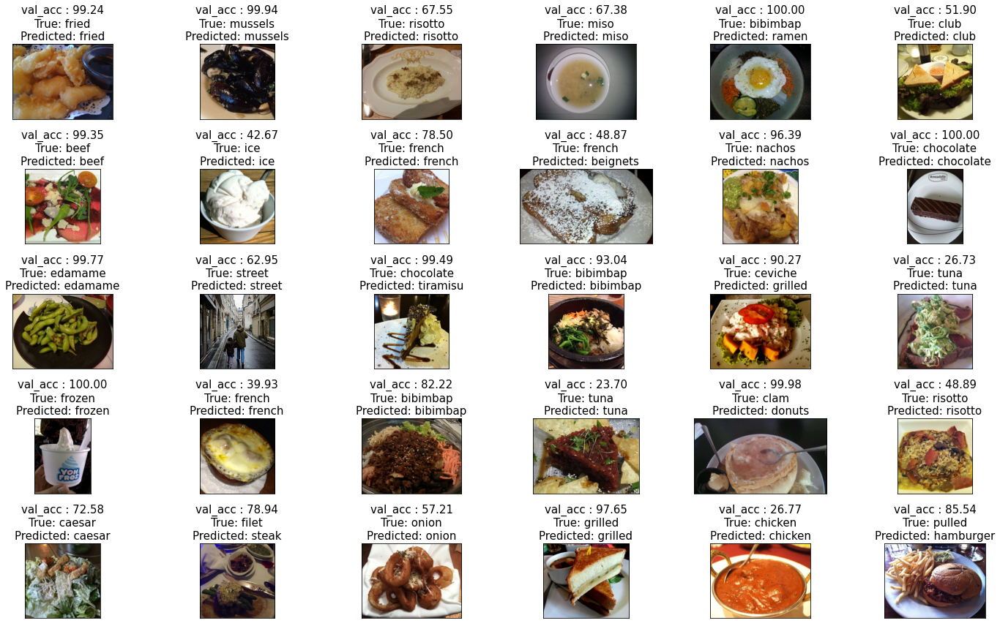

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+300]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+300].split('_')[0]}\nPredicted: {pred[i+300].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 36ms/step


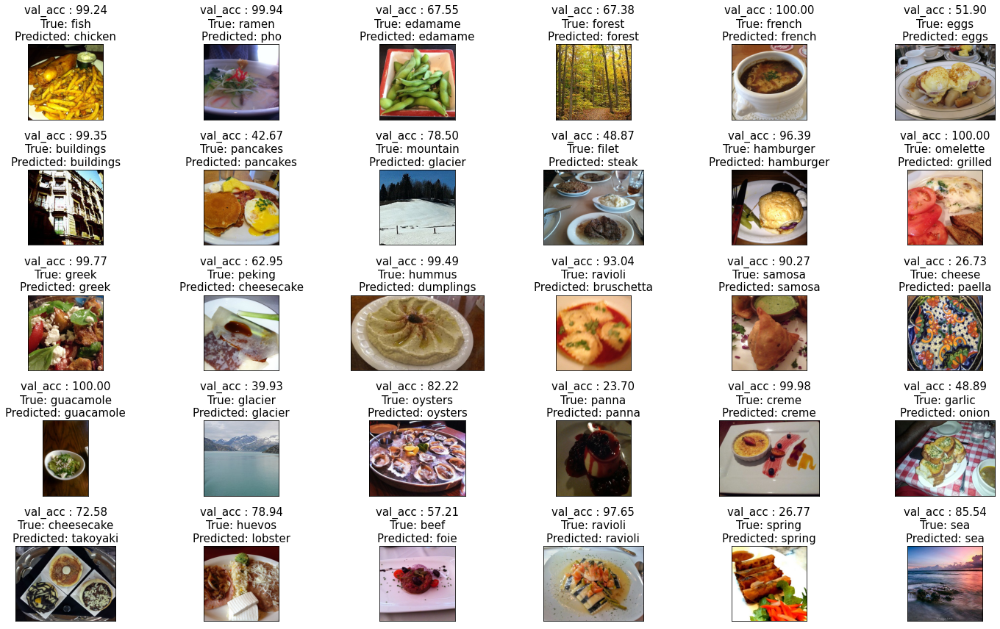

In [ ]:
# Display picture of the dataset with their labels
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(20, 12),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    test_image = image.load_img(test_df.iloc[i, 0]
                                ,target_size =IMAGE_SIZE )
    test_image = image.img_to_array(test_image)
    plt.imshow(test_image/255.);

    test_image = test_image.reshape((1, test_image.shape[0], test_image.shape[1], test_image.shape[2]))
    test_image = preprocess_input(test_image)
    prediction = model.predict(test_image)
    df = pd.DataFrame({'pred':prediction[0]})
    df = df.sort_values(by='pred', ascending=False, na_position='first')
    # printmd(f"## 예측률 : {(df.iloc[0]['pred'])* 100:.2f}%")

    ax.imshow(plt.imread(test_df.Filepath.iloc[i+400]))
    ax.set_title(f"val_acc : {(df.iloc[0]['pred'])* 100:.2f}\nTrue: {test_df.Label.iloc[i+400].split('_')[0]}\nPredicted: {pred[i+400].split('_')[0]}", fontsize = 15)
plt.tight_layout()
plt.show()